# 数据挖掘大作业 - 北京市房价预测

## 小组成员
+ 周慧鹏(3220201027):数据爬取分析和分析处理、算法分析和实现、文档编写 
+ 刘欣睿(3220200923):数据可视化、算法分析和实现、文档编写 
+ 罗楠(3220200932):数据爬取分析和分析处理、算法分析和实现、文档编写 
+ 刘雨程(3220200926):数据可视化、算法分析和实现、文档编写 
+ 康子健(3120201034):数据爬取分析和分析处理、算法分析和实现、文档编写

## 问题背景以及分析

房价是人⺠群众及其关注的热点以及重点问题，房价的走势关系着人⺠的生活以及社会的发展。因此，
本小组从此出发点切入，利用数据挖掘相关技术和思想，对历年来北京市二手房房价进行搜集、分析和
处理，利用相关算法对整理后的数据进行仔细分析和研究。最后，形成对北京市二手房数据的分析、可
视化展示、以及利用相关算法(例如，将房价预测价格问题作为回归任务)对未来房价进行预测。

## 本项目结构



## 其他

### 本项目使用以下库以及对应的版本
```bash
python == 3.8
numpy == 1.19.2 
pandas == 1.2.3
sklearn  == 0.2.4

```

## 1 链家数据数据读取

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
f=open(r'./data/lianjia1.csv',encoding='gbk')
data=pd.read_csv(f)
#print(len(data)) 1536
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,haoping,cjdanjia,cjxiaoqu,xingming,cjzhouqi,biaoqian,cjlouceng,cjshijian,congyenianxian,bankuai
0,37,红莲北里店,251.0,店经理,97% 141,43997元/平,红莲北里 3室1厅 57平,郭海龙,36,房东信赖;销售达人;带看活跃,南 北/高楼层/6层,签约时间：2015-05-24,4-5年,马连道
1,37,红莲北里店,159.0,店经理,97% 141,36969元/平,红莲南里 1室1厅 43平,郭海龙,36,房东信赖;销售达人;带看活跃,南/高楼层/7层,签约时间：2015-05-10,4-5年,马连道
2,37,红莲北里店,257.0,店经理,97% 141,39046元/平,常青藤嘉园 1室1厅 65平,郭海龙,36,房东信赖;销售达人;带看活跃,北/低楼层/16层,签约时间：2015-04-26,4-5年,马连道
3,37,红莲北里店,243.0,店经理,97% 141,41313元/平,红莲北里 2室1厅 58平,郭海龙,36,房东信赖;销售达人;带看活跃,南 北/高楼层/6层,签约时间：2015-04-04,4-5年,马连道
4,37,红莲北里店,372.5,店经理,97% 141,42053元/平,广安门外大街 3室1厅 88平,郭海龙,36,房东信赖;销售达人;带看活跃,东 南 西 北/中楼层/18层,签约时间：2015-04-01,4-5年,马连道


In [2]:
# 拼接8个数据集
data_list=[]
for i in range(1,8):
    try:
        f=open(r'./data/lianjia{}.csv'.format(i),encoding='gbk')
        data=pd.read_csv(f)
    except:
        f=open(r'./data/lianjia{}.csv'.format(i),encoding='utf-8')
        data=pd.read_csv(f)
    data_list.append(data)
data = pd.concat(data_list)
print(len(data)) # 数据总量为162227
data.tail()

162227


,cjtaoshu,mendian,cjzongjia,zhiwei,haoping,cjdanjia,cjxiaoqu,xingming,cjzhouqi,biaoqian,cjlouceng,cjshijian,congyenianxian,bankuai
6676,5,夏威夷南岸店,65.0,经纪人,100% 17,12467元/平,福城上上城二季 1室--厅 52平,武晓影,73,客户热评,南/低楼层/18层,签约时间：2015-12-02,1-2年,NaN
6677,4,加州水郡店,193.0,经纪人,95% 21,36156元/平,大宁山庄四区 1室1厅 53平,董玉俏,6,NaN,南/中楼层/6层,签约时间：2016-10-16,<1年,长阳
6678,4,加州水郡店,295.0,经纪人,95% 21,33909元/平,加州水郡三期 2室1厅 87平,董玉俏,6,NaN,南 北/高楼层/15层,签约时间：2016-09-24,<1年,长阳
6679,4,加州水郡店,310.0,经纪人,95% 21,21075元/平,加州水郡三期 3室2厅 147平,董玉俏,6,NaN,东 南 北/低楼层/14层,签约时间：2016-09-17,<1年,长阳
6680,4,加州水郡店,120.0,经纪人,95% 21,25494元/平,新建巷小区 1室1厅 47平,董玉俏,6,NaN,南/中楼层/4层,签约时间：2016-09-14,<1年,长阳


In [3]:
#查看数据描述
data.describe()

,cjtaoshu,cjzongjia
count,162227.000000,162226.000000
mean,29.111923,317.481277
std,19.607250,207.472106
min,1.000000,0.000000
25%,16.000000,190.000000
50%,26.000000,266.000000
75%,38.000000,385.000000
max,186.000000,6000.000000


In [4]:
#查看数据描述
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 162227 entries, 0 to 6680
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   cjtaoshu        162227 non-null  int64  
 1   mendian         162214 non-null  object 
 2   cjzongjia       162226 non-null  float64
 3   zhiwei          162226 non-null  object 
 4   haoping         162226 non-null  object 
 5   cjdanjia        162226 non-null  object 
 6   cjxiaoqu        162226 non-null  object 
 7   xingming        162226 non-null  object 
 8   cjzhouqi        162226 non-null  object 
 9   biaoqian        145553 non-null  object 
 10  cjlouceng       162226 non-null  object 
 11  cjshijian       162226 non-null  object 
 12  congyenianxian  162226 non-null  object 
 13  bankuai         160906 non-null  object 
dtypes: float64(1), int64(1), object(12)
memory usage: 18.6+ MB


### 1.1 抽取特征数据
我们总共选取了相关特征数据进行分析，其中包括了：成交套数、门店、成交总价、职位、成交小区、成交楼层、成交时间、板块等。

In [5]:
# 抽取特征数据进行分析
data=data[['cjtaoshu','mendian','cjzongjia','zhiwei','cjxiaoqu','cjlouceng','cjshijian','bankuai']]
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,cjxiaoqu,cjlouceng,cjshijian,bankuai
0,37,红莲北里店,251.0,店经理,红莲北里 3室1厅 57平,南 北/高楼层/6层,签约时间：2015-05-24,马连道
1,37,红莲北里店,159.0,店经理,红莲南里 1室1厅 43平,南/高楼层/7层,签约时间：2015-05-10,马连道
2,37,红莲北里店,257.0,店经理,常青藤嘉园 1室1厅 65平,北/低楼层/16层,签约时间：2015-04-26,马连道
3,37,红莲北里店,243.0,店经理,红莲北里 2室1厅 58平,南 北/高楼层/6层,签约时间：2015-04-04,马连道
4,37,红莲北里店,372.5,店经理,广安门外大街 3室1厅 88平,东 南 西 北/中楼层/18层,签约时间：2015-04-01,马连道


In [6]:
# 对汇总数据进行清洗
data.dropna(how='any')
data.drop_duplicates(keep='first', inplace=True)
# 删除其中总价有异常的数据
data = data.loc[data['cjzongjia']>50.0]
print("处理后数据集大小：",len(data))

处理后数据集大小： 143763
<ipython-input-6-9b022b87f4fe>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.drop_duplicates(keep='first', inplace=True)


In [7]:
# 处理特征mendian
mendian_map = data['mendian'].unique()
mendian_dict = {}
for i in range(0, len(mendian_map)):
    x = {mendian_map[i]:int(i+1)}
    mendian_dict.update(x)
data['mendian'] = data['mendian'].map(mendian_dict)
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,cjxiaoqu,cjlouceng,cjshijian,bankuai
0,37,1,251.0,店经理,红莲北里 3室1厅 57平,南 北/高楼层/6层,签约时间：2015-05-24,马连道
1,37,1,159.0,店经理,红莲南里 1室1厅 43平,南/高楼层/7层,签约时间：2015-05-10,马连道
2,37,1,257.0,店经理,常青藤嘉园 1室1厅 65平,北/低楼层/16层,签约时间：2015-04-26,马连道
3,37,1,243.0,店经理,红莲北里 2室1厅 58平,南 北/高楼层/6层,签约时间：2015-04-04,马连道
4,37,1,372.5,店经理,广安门外大街 3室1厅 88平,东 南 西 北/中楼层/18层,签约时间：2015-04-01,马连道


In [8]:
# 处理特征zhiwei
zhiwei_map = data['zhiwei'].unique()
zhiwei_dict = {}
for i in range(0, len(zhiwei_map)):
    x = {zhiwei_map[i]:int(i+1)}
    zhiwei_dict.update(x)
data['zhiwei'] = data['zhiwei'].map(zhiwei_dict)
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,cjxiaoqu,cjlouceng,cjshijian,bankuai
0,37,1,251.0,1,红莲北里 3室1厅 57平,南 北/高楼层/6层,签约时间：2015-05-24,马连道
1,37,1,159.0,1,红莲南里 1室1厅 43平,南/高楼层/7层,签约时间：2015-05-10,马连道
2,37,1,257.0,1,常青藤嘉园 1室1厅 65平,北/低楼层/16层,签约时间：2015-04-26,马连道
3,37,1,243.0,1,红莲北里 2室1厅 58平,南 北/高楼层/6层,签约时间：2015-04-04,马连道
4,37,1,372.5,1,广安门外大街 3室1厅 88平,东 南 西 北/中楼层/18层,签约时间：2015-04-01,马连道


In [9]:
# 处理特征bankuai
bankuai_map = data['bankuai'].unique()
bankuai_dict = {}
for i in range(0, len(bankuai_map)):
    x = {bankuai_map[i]:int(i+1)}
    bankuai_dict.update(x)
data['bankuai'] = data['bankuai'].map(bankuai_dict)
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,cjxiaoqu,cjlouceng,cjshijian,bankuai
0,37,1,251.0,1,红莲北里 3室1厅 57平,南 北/高楼层/6层,签约时间：2015-05-24,1
1,37,1,159.0,1,红莲南里 1室1厅 43平,南/高楼层/7层,签约时间：2015-05-10,1
2,37,1,257.0,1,常青藤嘉园 1室1厅 65平,北/低楼层/16层,签约时间：2015-04-26,1
3,37,1,243.0,1,红莲北里 2室1厅 58平,南 北/高楼层/6层,签约时间：2015-04-04,1
4,37,1,372.5,1,广安门外大街 3室1厅 88平,东 南 西 北/中楼层/18层,签约时间：2015-04-01,1


In [10]:
# 处理特征cjxiaoqu:分成三个特征：xiaoqu，buju，daxiao
# 首先处理特征小区:xiaoqu
data['xiaoqu'] = data.cjxiaoqu.map(lambda x:x.split(' ')[0])
xiaoqu_map = data['xiaoqu'].unique()
xiaoqu_dict = {}
for i in range(0, len(xiaoqu_map)):
    x = {xiaoqu_map[i]:int(i+1)}
    xiaoqu_dict.update(x)
data['xiaoqu'] = data['xiaoqu'].map(xiaoqu_dict)
data

,cjtaoshu,mendian,cjzongjia,zhiwei,cjxiaoqu,cjlouceng,cjshijian,bankuai,xiaoqu
0,37,1,251.0,1,红莲北里 3室1厅 57平,南 北/高楼层/6层,签约时间：2015-05-24,1,1
1,37,1,159.0,1,红莲南里 1室1厅 43平,南/高楼层/7层,签约时间：2015-05-10,1,2
2,37,1,257.0,1,常青藤嘉园 1室1厅 65平,北/低楼层/16层,签约时间：2015-04-26,1,3
3,37,1,243.0,1,红莲北里 2室1厅 58平,南 北/高楼层/6层,签约时间：2015-04-04,1,1
4,37,1,372.5,1,广安门外大街 3室1厅 88平,东 南 西 北/中楼层/18层,签约时间：2015-04-01,1,4
...,...,...,...,...,...,...,...,...,...
6676,5,1472,65.0,2,福城上上城二季 1室--厅 52平,南/低楼层/18层,签约时间：2015-12-02,187,5627
6677,4,1417,193.0,2,大宁山庄四区 1室1厅 53平,南/中楼层/6层,签约时间：2016-10-16,88,4993
6678,4,1417,295.0,2,加州水郡三期 2室1厅 87平,南 北/高楼层/15层,签约时间：2016-09-24,88,3495
6679,4,1417,310.0,2,加州水郡三期 3室2厅 147平,东 南 北/低楼层/14层,签约时间：2016-09-17,88,3495


In [11]:
# 处理特征房间布局：buju
data['buju'] = data.cjxiaoqu.map(lambda x:x.split(' ')[1])
buju_map = data['buju'].unique()
buju_dict = {}
for i in range(0, len(buju_map)):
    x = {buju_map[i]:int(i+1)}
    buju_dict.update(x)
data['buju'] = data['buju'].map(buju_dict)
data

,cjtaoshu,mendian,cjzongjia,zhiwei,cjxiaoqu,cjlouceng,cjshijian,bankuai,xiaoqu,buju
0,37,1,251.0,1,红莲北里 3室1厅 57平,南 北/高楼层/6层,签约时间：2015-05-24,1,1,1
1,37,1,159.0,1,红莲南里 1室1厅 43平,南/高楼层/7层,签约时间：2015-05-10,1,2,2
2,37,1,257.0,1,常青藤嘉园 1室1厅 65平,北/低楼层/16层,签约时间：2015-04-26,1,3,2
3,37,1,243.0,1,红莲北里 2室1厅 58平,南 北/高楼层/6层,签约时间：2015-04-04,1,1,3
4,37,1,372.5,1,广安门外大街 3室1厅 88平,东 南 西 北/中楼层/18层,签约时间：2015-04-01,1,4,1
...,...,...,...,...,...,...,...,...,...,...
6676,5,1472,65.0,2,福城上上城二季 1室--厅 52平,南/低楼层/18层,签约时间：2015-12-02,187,5627,7
6677,4,1417,193.0,2,大宁山庄四区 1室1厅 53平,南/中楼层/6层,签约时间：2016-10-16,88,4993,2
6678,4,1417,295.0,2,加州水郡三期 2室1厅 87平,南 北/高楼层/15层,签约时间：2016-09-24,88,3495,3
6679,4,1417,310.0,2,加州水郡三期 3室2厅 147平,东 南 北/低楼层/14层,签约时间：2016-09-17,88,3495,4


In [12]:
# 处理特征房间大小：daxiao
data['daxiao'] = data.cjxiaoqu.map(lambda x:x.split(' ')[2])
data['daxiao'] = data['daxiao'].map(lambda x:x.replace('平',''))
data['daxiao'] = data['daxiao'].map(lambda x:int(x))
# 有标注错误的数据因此需要删掉大小异常的数据
# data['daxiao'].unique()
# data[data['daxiao']>400]
data = data.loc[data['daxiao']<1000]
data['daxiao'].unique()
data = data.drop('cjxiaoqu',axis=1)

In [13]:
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,cjlouceng,cjshijian,bankuai,xiaoqu,buju,daxiao
0,37,1,251.0,1,南 北/高楼层/6层,签约时间：2015-05-24,1,1,1,57
1,37,1,159.0,1,南/高楼层/7层,签约时间：2015-05-10,1,2,2,43
2,37,1,257.0,1,北/低楼层/16层,签约时间：2015-04-26,1,3,2,65
3,37,1,243.0,1,南 北/高楼层/6层,签约时间：2015-04-04,1,1,3,58
4,37,1,372.5,1,东 南 西 北/中楼层/18层,签约时间：2015-04-01,1,4,1,88


In [14]:
# 处理特征:cjshijian
data['cjshijian'] = data.cjshijian.map(lambda x:x.split('：')[1])
data['cjshijian'] = data['cjshijian'].map(lambda x:x.split('-')[0])
data['cjshijian'] = data['cjshijian'].map(lambda x:int(x))
# data[data['daxiao']>400]
data['cjshijian'].unique()

array([2015, 2013, 2012, 2016, 2014, 2011, 2002, 2003, 2006, 2010])

In [15]:
data.head()

,cjtaoshu,mendian,cjzongjia,zhiwei,cjlouceng,cjshijian,bankuai,xiaoqu,buju,daxiao
0,37,1,251.0,1,南 北/高楼层/6层,2015,1,1,1,57
1,37,1,159.0,1,南/高楼层/7层,2015,1,2,2,43
2,37,1,257.0,1,北/低楼层/16层,2015,1,3,2,65
3,37,1,243.0,1,南 北/高楼层/6层,2015,1,1,3,58
4,37,1,372.5,1,东 南 西 北/中楼层/18层,2015,1,4,1,88


In [16]:
# 处理特征:cjlouceng，首先处理特征方向:fangxiang
data['fangxiang'] = data.cjlouceng.map(lambda x:x.split('/')[0])
fangxiang_map = data['fangxiang'].unique()
fangxiang_dict = {}
for i in range(0, len(fangxiang_map)):
    x = {fangxiang_map[i]:int(i+1)}
    fangxiang_dict.update(x)
data['fangxiang'] = data['fangxiang'].map(fangxiang_dict)
data


,cjtaoshu,mendian,cjzongjia,zhiwei,cjlouceng,cjshijian,bankuai,xiaoqu,buju,daxiao,fangxiang
0,37,1,251.0,1,南 北/高楼层/6层,2015,1,1,1,57,1
1,37,1,159.0,1,南/高楼层/7层,2015,1,2,2,43,2
2,37,1,257.0,1,北/低楼层/16层,2015,1,3,2,65,3
3,37,1,243.0,1,南 北/高楼层/6层,2015,1,1,3,58,1
4,37,1,372.5,1,东 南 西 北/中楼层/18层,2015,1,4,1,88,4
...,...,...,...,...,...,...,...,...,...,...,...
6676,5,1472,65.0,2,南/低楼层/18层,2015,187,5627,7,52,2
6677,4,1417,193.0,2,南/中楼层/6层,2016,88,4993,2,53,2
6678,4,1417,295.0,2,南 北/高楼层/15层,2016,88,3495,3,87,1
6679,4,1417,310.0,2,东 南 北/低楼层/14层,2016,88,3495,4,147,9


In [17]:
# 处理特征:cjlouceng，处理特征高低楼层:gaodi
data['gaodi'] = data.cjlouceng.map(lambda x:x.split('/')[1])
gaodi_map = data['gaodi'].unique()
gaodi_dict = {}
for i in range(0, len(gaodi_map)):
    x = {gaodi_map[i]:int(i+1)}
    gaodi_dict.update(x)
data['gaodi'] = data['gaodi'].map(gaodi_dict)
data

,cjtaoshu,mendian,cjzongjia,zhiwei,cjlouceng,cjshijian,bankuai,xiaoqu,buju,daxiao,fangxiang,gaodi
0,37,1,251.0,1,南 北/高楼层/6层,2015,1,1,1,57,1,1
1,37,1,159.0,1,南/高楼层/7层,2015,1,2,2,43,2,1
2,37,1,257.0,1,北/低楼层/16层,2015,1,3,2,65,3,2
3,37,1,243.0,1,南 北/高楼层/6层,2015,1,1,3,58,1,1
4,37,1,372.5,1,东 南 西 北/中楼层/18层,2015,1,4,1,88,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...
6676,5,1472,65.0,2,南/低楼层/18层,2015,187,5627,7,52,2,2
6677,4,1417,193.0,2,南/中楼层/6层,2016,88,4993,2,53,2,3
6678,4,1417,295.0,2,南 北/高楼层/15层,2016,88,3495,3,87,1,1
6679,4,1417,310.0,2,东 南 北/低楼层/14层,2016,88,3495,4,147,9,2


In [18]:
# 处理特征:cjlouceng，处理特征楼层数:cengshu
data['cengshu'] = data.cjlouceng.map(lambda x:x.split('/')[2])
data['cengshu'] = data['cengshu'].map(lambda x:x.replace('层',''))
data = data.loc[data['cengshu']!='']
data = data.loc[data['cengshu']!='0']
data['cengshu'] = data['cengshu'].map(lambda x:int(x))
data['cengshu'].unique()
data = data.drop('cjlouceng', axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 143665 entries, 0 to 6680
Data columns (total 12 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   cjtaoshu   143665 non-null  int64  
 1   mendian    143665 non-null  int64  
 2   cjzongjia  143665 non-null  float64
 3   zhiwei     143665 non-null  int64  
 4   cjshijian  143665 non-null  int64  
 5   bankuai    143665 non-null  int64  
 6   xiaoqu     143665 non-null  int64  
 7   buju       143665 non-null  int64  
 8   daxiao     143665 non-null  int64  
 9   fangxiang  143665 non-null  int64  
 10  gaodi      143665 non-null  int64  
 11  cengshu    143665 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 14.2 MB


In [19]:
data

,cjtaoshu,mendian,cjzongjia,zhiwei,cjshijian,bankuai,xiaoqu,buju,daxiao,fangxiang,gaodi,cengshu
0,37,1,251.0,1,2015,1,1,1,57,1,1,6
1,37,1,159.0,1,2015,1,2,2,43,2,1,7
2,37,1,257.0,1,2015,1,3,2,65,3,2,16
3,37,1,243.0,1,2015,1,1,3,58,1,1,6
4,37,1,372.5,1,2015,1,4,1,88,4,3,18
...,...,...,...,...,...,...,...,...,...,...,...,...
6676,5,1472,65.0,2,2015,187,5627,7,52,2,2,18
6677,4,1417,193.0,2,2016,88,4993,2,53,2,3,6
6678,4,1417,295.0,2,2016,88,3495,3,87,1,1,15
6679,4,1417,310.0,2,2016,88,3495,4,147,9,2,14


## 2 预测房价

In [20]:
# 分配数据集-训练集和测试集
prices = data['cjzongjia']
features = data.drop('cjzongjia', axis = 1)
print('北京二手房房价有数据 {0} 条，字段 {1} 个。'.format(*data.shape))
data.head()

北京二手房房价有数据 143665 条，字段 12 个。


,cjtaoshu,mendian,cjzongjia,zhiwei,cjshijian,bankuai,xiaoqu,buju,daxiao,fangxiang,gaodi,cengshu
0,37,1,251.0,1,2015,1,1,1,57,1,1,6
1,37,1,159.0,1,2015,1,2,2,43,2,1,7
2,37,1,257.0,1,2015,1,3,2,65,3,2,16
3,37,1,243.0,1,2015,1,1,3,58,1,1,6
4,37,1,372.5,1,2015,1,4,1,88,4,3,18


In [37]:
import numpy as np

# 转换训练测试集格式为数组
features = np.array(features)
prices = np.array(prices)
# 查看数据
print(features[3])
print(prices[3])

# 导入sklearn进行训练测试集划分
from sklearn.model_selection import train_test_split
features_train, features_test, prices_train, prices_test = train_test_split(features, prices, test_size=0.2, random_state=0)

[  37    1    1 2015    1    1    3   58    1    1    6]
243.0


### 2.1 线性回归方法
使用简易的线性回归方法，对房价进行回归预测


In [28]:
from sklearn import linear_model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math

In [29]:
#模型可视化，用于评估预测价格与真实价格之间的误差，黄色点越接近绿色直线，说明预测价格更接近真实价格 
def show(price_test,predict_price):
    plt.plot(price_test, predict_price, color='y', marker='o')
    plt.plot(price_test, price_test,color='g', marker='+')
    plt.show()


In [32]:
# 使用 sklern 中的线性回归模型进行拟合，所使用数据为之前划分的数据 feature、price
clf = linear_model.LinearRegression()
clf.fit(features,prices)

LinearRegression()

In [35]:
w = clf.coef_
print("w = ",w)
b = clf.intercept_  #线性回归模型计算截距值
print("b = ",b)

R_Square = clf.score(features,prices)  #判定系数R-Square,即描述模型和数据的拟合程度
print(R_Square)

w =  [-1.23883984e+00 -4.13477232e-02 -2.58459007e+00  3.44203711e+01
 -1.28864308e-01  3.88772033e-04 -6.16314564e-01  3.28291246e+00
  1.20899612e+00  4.80080915e+00  1.19020353e+00]
b =  -69256.7289212963
0.4740792626237583


In [38]:
#使用features测试price，这里只列举了一个样本的特征进行价格的预测

a=[[37, 1, 1, 2015, 1, 1, 3, 58, 1, 1, 6]]
price_a=243
predict_a = clf.predict(a)
print("predict_a=",predict_a)


predict_a= [253.43841349]


可以看到，我们使用数据集中数据进行测试，可以看到，真实结果为243，我们使用线性回归进行预测的结果为253.43

[558.77479985 234.38451753 276.83234237 ... 350.21659747 159.6047354
 269.60844888]
error= 0.3229252612392322


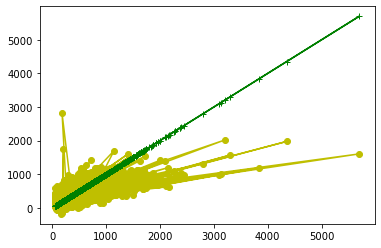

In [43]:
#使用测试集评估模型,首先输入测试集features，得到预测的price
#print(price_test)
predict_price = clf.predict(features_test)
list(predict_price)  #预测价格生成列表
print(predict_price)

error_sum =sum(np.sqrt((prices_test-predict_price)**2)) #求解预测price与真实price之间的误差总和
price_test_sum =sum(prices_test)
error =error_sum/price_test_sum  #评估模型的准确度
print("error=",error)
show(prices_test,predict_price)

In [49]:
# 使用平均绝对误差（MAE）、均方误差（MSE）、均方根误差（RMSE）等方法进行测试
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

print('MAE = ', mean_absolute_error(prices_test,predict_price))
print('MSE = ', mean_squared_error(prices_test,predict_price))
print('RMSE = ', math.sqrt(mean_squared_error(prices_test,predict_price)))

MAE =  103.10067115191485
MSE =  23041.925505446154
RMSE =  151.7956702460454


### 2.2 决策树回归方法
建立决策树回归模型，通过GridSearchCV找到最优深度参数。

In [45]:
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV

# 利用GridSearchCV计算最优解
def fit_model(X, y):
    """ 基于输入数据 [X,y]，利于网格搜索找到最优的决策树模型"""
    
    cross_validator = KFold(10, shuffle=True)
      
    regressor = DecisionTreeRegressor()
    
    params = {'max_depth':[1,2,3,4,5,6,7,8,9,10]}
    
    scoring_fnc = make_scorer(performance_metric)
    
    grid = GridSearchCV(estimator = regressor, param_grid = params, scoring = scoring_fnc, cv = cross_validator)

    # 基于输入数据 [X,y]，进行网格搜索
    grid = grid.fit(X, y)
#     print pd.DataFrame(grid.cv_results_)
    return grid.best_estimator_

# 计算R2分数
def performance_metric(y_true, y_predict):
    """计算并返回预测值相比于预测值的分数"""
    from sklearn.metrics import r2_score
    score = r2_score(y_true, y_predict)

    return score

In [44]:

optimal_reg1 = fit_model(features_train, prices_train)

# 输出最优模型的 'max_depth' 参数
print("最理想模型的参数 'max_depth' 是 {} 。".format(optimal_reg1.get_params()['max_depth']))

predicted_value = optimal_reg1.predict(features_test)
r2 = performance_metric(prices_test, predicted_value)

print("最优模型在测试数据上 R^2 分数 {:,.2f}。".format(r2))

最理想模型的参数 'max_depth' 是 10 。
最优模型在测试数据上 R^2 分数 0.52。


error= 0.2814262111472279


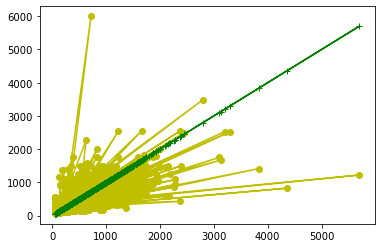

In [46]:
error_sum =sum(np.sqrt((prices_test-predicted_value)**2)) #求解预测price与真实price之间的误差总和
price_test_sum =sum(prices_test)
error =error_sum/price_test_sum  #评估模型的准确度
print("error=",error)
show(prices_test,predicted_value)

In [50]:
# 使用平均绝对误差（MAE）、均方误差（MSE）、均方根误差（RMSE）等方法进行测试
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

print('MAE = ', mean_absolute_error(prices_test,predicted_value))
print('MSE = ', mean_squared_error(prices_test,predicted_value))
print('RMSE = ', math.sqrt(mean_squared_error(prices_test,predicted_value)))

MAE =  89.85122792089123
MSE =  20585.387523687503
RMSE =  143.47608694025462
